<a href="https://colab.research.google.com/github/RohsanNur/TrainingBola/blob/main/NewTrain.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%tensorflow_version 1.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
   raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))
print(tf.__version__)

TensorFlow 1.x selected.
Found GPU at: /device:GPU:0
1.15.2


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd '/content/drive/Shareddrives/Jetson/New_Train'

#!git clone https://github.com/tensorflow/models.git

!apt-get install protobuf-compiler python-pil python-lxml python-tk
!pip install Cython

/content/drive/Shareddrives/Jetson/New_Train
Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
python-tk is already the newest version (2.7.17-1~18.04).
The following additional packages will be installed:
  python-bs4 python-chardet python-html5lib python-olefile
  python-pkg-resources python-six python-webencodings
Suggested packages:
  python-genshi python-lxml-dbg python-lxml-doc python-pil-doc python-pil-dbg
  python-setuptools
The following NEW packages will be installed:
  python-bs4 python-chardet python-html5lib python-lxml python-olefile
  python-pil python-pkg-resources python-six python-webencodings
0 upgraded, 9 newly installed, 0 to remove and 39 not upgraded.
Need to get 1,614 kB of archives.
After this operation, 8,908 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 python-bs4 all 4.6.0-1 [67.9 kB]
Get:2 htt

In [ ]:
%cd /content/drive/Shareddrives/Jetson/New_Train/models/research

!protoc object_detection/protos/*.proto --python_out=.

/content/drive/Shareddrives/Jetson/New_Train/models/research


In [ ]:
import os
os.environ['PYTHONPATH'] += ':/content/drive/Shareddrives/Jetson/New_Train/models/research/slim:/content/drive/Shareddrives/Jetson/New_Train/models/research/object_detection:/content/drive/Shareddrives/Jetson/New_Train/models/research'

In [ ]:
%cd '/content/drive/Shareddrives/Jetson/New_Train/models/research/slim'
!python setup.py build
!python setup.py install

/content/drive/Shareddrives/Jetson/New_Train/models/research/slim
running build
running build_py
running egg_info
writing slim.egg-info/PKG-INFO
writing dependency_links to slim.egg-info/dependency_links.txt
writing requirements to slim.egg-info/requires.txt
writing top-level names to slim.egg-info/top_level.txt
writing manifest file 'slim.egg-info/SOURCES.txt'
running install
running bdist_egg
running egg_info
writing slim.egg-info/PKG-INFO
writing dependency_links to slim.egg-info/dependency_links.txt
writing requirements to slim.egg-info/requires.txt
writing top-level names to slim.egg-info/top_level.txt
writing manifest file 'slim.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_py
creating build/bdist.linux-x86_64/egg
creating build/bdist.linux-x86_64/egg/datasets
copying build/lib/datasets/imagenet_lsvrc_2015_synsets.txt -> build/bdist.linux-x86_64/egg/datasets
copying build/lib/datasets/download_and_convert_flowers.p

In [ ]:
%cd /content/drive/Shareddrives/Jetson/New_Train/models/research/object_detection/
#!pip install tf-models-official
!pip install tf_slim
!python builders/model_builder_test.py

/content/drive/Shareddrives/Jetson/New_Train/models/research/object_detection


In [ ]:
%cd /content/drive/Shareddrives/Jetson/New_Train/training_workspace/images/train

#!unzip test_img.zip
#!unzip LabelTraining.zip


/content/drive/Shareddrives/Jetson/New_Train/training_workspace/images/train


In [ ]:
%cd /content/drive/Shareddrives/Jetson/New_Train/training_workspace

import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET
def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        base = os.path.basename(xml_file)
        file_name = os.path.splitext(base)[0] + ".jpg"
        root = tree.getroot()
        for member in root.findall('object'):
            value = (file_name,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df
def main(directory_list):
    for Image_cat in directory_list:
        image_path = os.path.join(os.getcwd(), 'images/{}'.format(Image_cat))
        xml_df = xml_to_csv(image_path) 
        xml_df.to_csv('{}_labels.csv'.format(Image_cat), index=None)
        print('Successfully converted xml to csv.')
main(['train','test'])

/content/drive/Shareddrives/Jetson/New_Train/training_workspace
Successfully converted xml to csv.
Successfully converted xml to csv.


In [ ]:
#%cd /content/drive/Shareddrives/Jetson/New_Train/script

#!pip install pandas

#!python generate_tfrecord.py -x /content/drive/Shareddrives/Jetson/New_Train/training_workspace/train -l /content/drive/Shareddrives/Jetson/New_Train/training_workspace/label_map.pbtxt -o /content/drive/Shareddrives/Jetson/New_Train/training_workspace/train.record

#!python generate_tfrecord.py -x /content/drive/Shareddrives/Jetson/New_Train/training_workspace/test -l /content/drive/Shareddrives/Jetson/New_Train/training_workspace/label_map.pbtxt -o /content/drive/Shareddrives/Jetson/New_Train/training_workspace/test.record

/content/drive/Shareddrives/Jetson/New_Train/script
Traceback (most recent call last):
  File "generate_tfrecord.py", line 172, in <module>
    tf.app.run()
  File "/tensorflow-1.15.2/python3.7/tensorflow_core/python/platform/app.py", line 40, in run
    _run(main=main, argv=argv, flags_parser=_parse_flags_tolerate_undef)
  File "/usr/local/lib/python3.7/dist-packages/absl/app.py", line 303, in run
    _run_main(main, args)
  File "/usr/local/lib/python3.7/dist-packages/absl/app.py", line 251, in _run_main
    sys.exit(main(argv))
  File "generate_tfrecord.py", line 162, in main
    tf_example = create_tf_example(group, path)
  File "generate_tfrecord.py", line 136, in create_tf_example
    classes.append(class_text_to_int(row['class']))
  File "generate_tfrecord.py", line 105, in class_text_to_int
    return label_map_dict[row_label]
KeyError: 'Robot'
Successfully created the TFRecord file: /content/drive/Shareddrives/Jetson/New_Train/training_workspace/test.record


In [ ]:
%cd /content/drive/Shareddrives/Jetson/New_Train/script

!python generate_tfrecord_single.py --label0='bola' --label1='robot' --csv_input=/content/drive/Shareddrives/Jetson/New_Train/training_workspace/train_labels.csv --output_path=/content/drive/Shareddrives/Jetson/New_Train/training_workspace/train.record --img_path=/content/drive/Shareddrives/Jetson/New_Train/training_workspace/images/train

/content/drive/Shareddrives/Jetson/New_Train/script

W0627 07:38:48.160382 139667880318848 module_wrapper.py:139] From generate_tfrecord_single.py:104: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.


W0627 07:38:49.045217 139667880318848 module_wrapper.py:139] From generate_tfrecord_single.py:62: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

Successfully created the TFRecords: /content/drive/Shareddrives/Jetson/New_Train/training_workspace/train.record


In [ ]:
%cd /content/drive/Shareddrives/Jetson/New_Train/script

!python generate_tfrecord_single.py --label0='bola' --label1='robot' --csv_input=/content/drive/Shareddrives/Jetson/New_Train/training_workspace/test_labels.csv --output_path=/content/drive/Shareddrives/Jetson/New_Train/training_workspace/test.record --img_path=/content/drive/Shareddrives/Jetson/New_Train/training_workspace/images/test

/content/drive/Shareddrives/Jetson/New_Train/script

W0627 08:41:23.163583 140582417549184 module_wrapper.py:139] From generate_tfrecord_single.py:104: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.


W0627 08:41:23.299164 140582417549184 module_wrapper.py:139] From generate_tfrecord_single.py:62: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

Successfully created the TFRecords: /content/drive/Shareddrives/Jetson/New_Train/training_workspace/test.record


In [ ]:
%cd /content/drive/Shareddrives/Jetson/New_Train
#!wget http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v1_coco_11_06_2017.tar.gz
!wget http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v2_coco_2018_03_29.tar.gz
#!tar -xvf ssd_mobilenet_v1_coco_11_06_2017.tar.gz
!tar -xvf ssd_mobilenet_v2_coco_2018_03_29.tar.gz

--2021-06-18 16:08:59--  http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v2_coco_2018_03_29.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 173.194.76.128, 2a00:1450:400c:c00::80
Connecting to download.tensorflow.org (download.tensorflow.org)|173.194.76.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 187925923 (179M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_coco_2018_03_29.tar.gz’

ssd_mobilenet_v2_co 100%[===================>] 179.22M  55.9MB/s    in 3.3s    

2021-06-18 16:09:03 (54.2 MB/s) - ‘ssd_mobilenet_v2_coco_2018_03_29.tar.gz’ saved [187925923/187925923]

ssd_mobilenet_v2_coco_2018_03_29/checkpoint
ssd_mobilenet_v2_coco_2018_03_29/model.ckpt.meta
ssd_mobilenet_v2_coco_2018_03_29/pipeline.config
ssd_mobilenet_v2_coco_2018_03_29/saved_model/saved_model.pb
ssd_mobilenet_v2_coco_2018_03_29/frozen_inference_graph.pb
ssd_mobilenet_v2_coco_2018_03_29/saved_model/
ssd_mobilenet_v2_coco_2018_03_29/saved_mod

In [ ]:
%cd /content/drive/Shareddrives/Jetson/New_Train/models/research/object_detection/
#!pip install tensorflow-object-detection-api
!python models/feature_map_generators.py

/content/drive/Shareddrives/Jetson/New_Train/models/research/object_detection


In [ ]:
%cd /content/drive/Shareddrives/Jetson/New_Train/script/
!python train.py --logtostderr --train_dir=/content/drive/Shareddrives/Jetson/New_Train/training_workspace/training --pipeline_config_path=/content/drive/Shareddrives/Jetson/New_Train/training_workspace/ssd_mobilenet_v2_coco.config

Streaming output truncated to the last 5000 lines.
INFO:tensorflow:global step 3642: loss = 3.2010 (1.596 sec/step)
I0627 09:55:29.630580 140616777844608 learning.py:512] global step 3642: loss = 3.2010 (1.596 sec/step)
INFO:tensorflow:global step 3643: loss = 2.6194 (0.623 sec/step)
I0627 09:55:30.255763 140616777844608 learning.py:512] global step 3643: loss = 2.6194 (0.623 sec/step)
INFO:tensorflow:global step 3644: loss = 3.2912 (1.027 sec/step)
I0627 09:55:31.357420 140616777844608 learning.py:512] global step 3644: loss = 3.2912 (1.027 sec/step)
INFO:tensorflow:global step 3645: loss = 2.2738 (1.495 sec/step)
I0627 09:55:33.031008 140616777844608 learning.py:512] global step 3645: loss = 2.2738 (1.495 sec/step)
INFO:tensorflow:Recording summary at step 3645.
I0627 09:55:34.832080 140612994844416 supervisor.py:1050] Recording summary at step 3645.
INFO:tensorflow:global step 3646: loss = 2.2068 (2.027 sec/step)
I0627 09:55:35.060022 140616777844608 learning.py:512] global step 364

In [ ]:
#!pip install tensorboardcolab
%load_ext tensorboard
%tensorboard --logdir /content/drive/Shareddrives/Jetson/New_Train/training_workspace/training

In [ ]:
%cd /content/drive/Shareddrives/Jetson/New_Train/training_workspace
#!python exporter_main_v2.py  --input_type image_tensor --pipeline_config_path ssd_mobilenet_v2_coco.config --trained_checkpoint_dir training/model-46650 --output_directory trained_inference_graph/
!python export_inference_graph.py --input_type image_tensor --pipeline_config_path /content/drive/Shareddrives/Jetson/New_Train/training_workspace/ssd_mobilenet_v2_coco.config --trained_checkpoint_prefix /content/drive/Shareddrives/Jetson/New_Train/training_workspace/training/model.ckpt-6009 --output_directory /content/drive/Shareddrives/Jetson/New_Train/training_workspace/checkpoint

/content/drive/Shareddrives/Jetson/New_Train/training_workspace
Instructions for updating:
Please use `layer.__call__` method instead.
W0627 10:48:41.826469 139704665192320 deprecation.py:323] From /usr/local/lib/python3.7/dist-packages/tf_slim-1.1.0-py3.7.egg/tf_slim/layers/layers.py:1089: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:depth of additional conv before box predictor: 0
I0627 10:48:43.763923 139704665192320 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0627 10:48:43.803844 139704665192320 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0627 10:48:43.843063 139704665192320 convolutional_box_predictor.py:156] depth 

  Cloning https://github.com/google-research/tf-slim.git to /tmp/pip-req-build-qz6cjufj
  Running command git clone -q https://github.com/google-research/tf-slim.git /tmp/pip-req-build-qz6cjufj
  Created wheel for tf-slim: filename=tf_slim-1.2.0-cp37-none-any.whl size=361059 sha256=eabe81f9d621c1ce556ee8be8be824529378bfdd549a41a7782d801f058dbc34
  Stored in directory: /tmp/pip-ephem-wheel-cache-c6sx6mxv/wheels/2b/ed/a5/aa04c89c01296fa98943d20f39c34b7d10d8671506823ba42e
Successfully built tf-slim
  Found existing installation: tf-slim 1.1.0
    Uninstalling tf-slim-1.1.0:
      Successfully uninstalled tf-slim-1.1.0
/content/drive/Shareddrives/Jetson/New_Train/models/research/object_detection


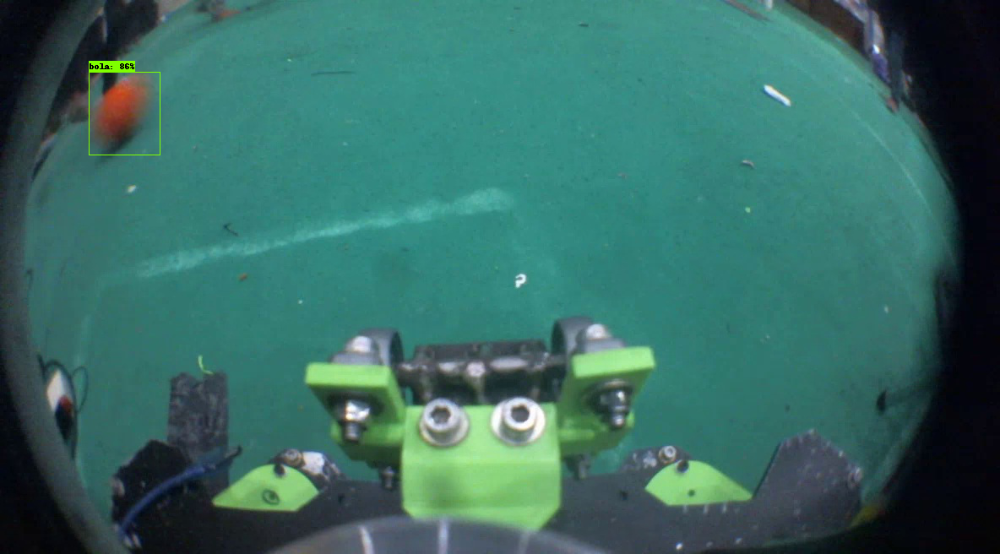

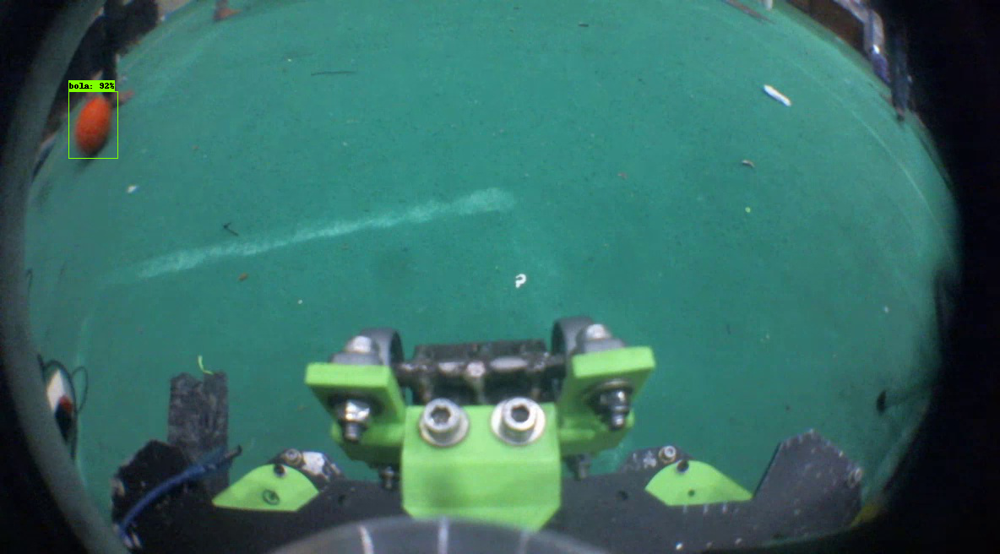

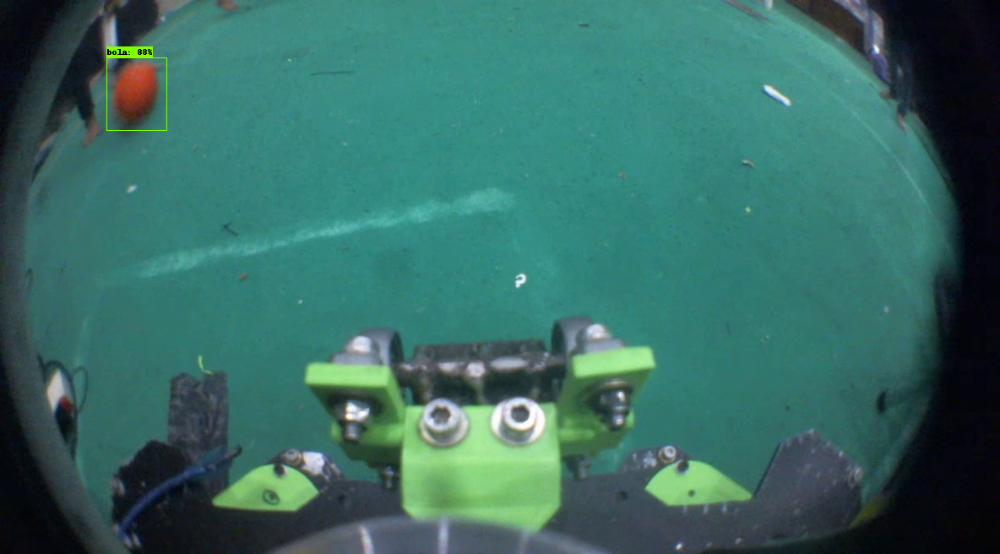

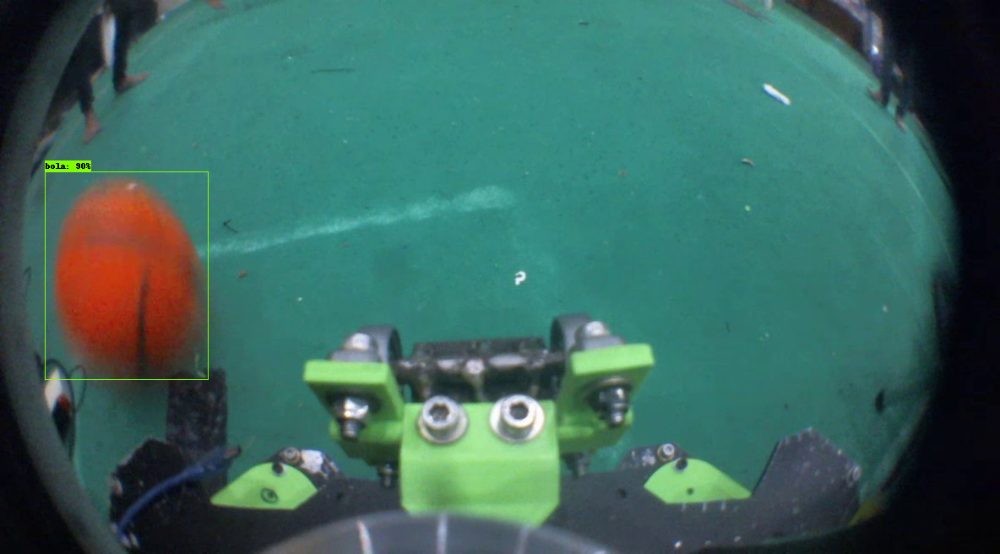

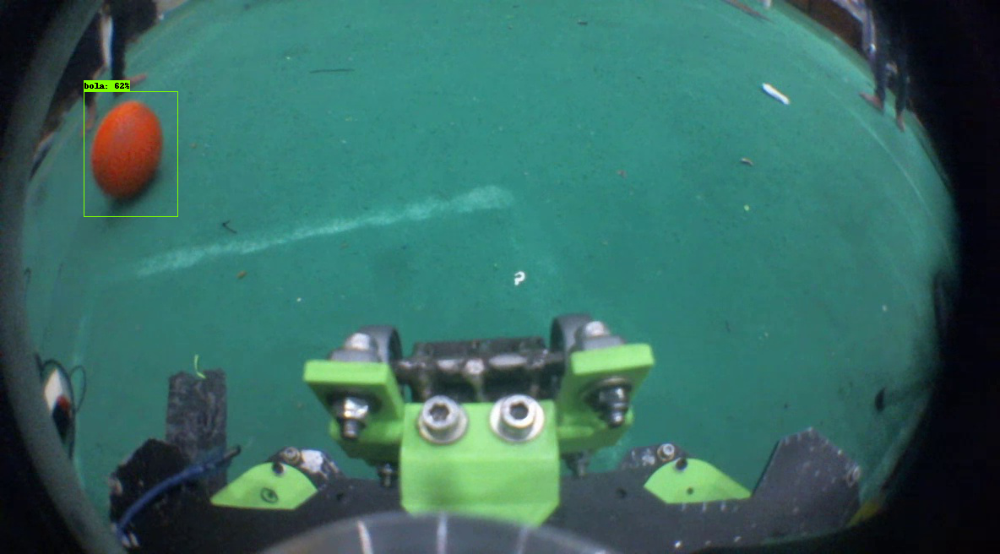

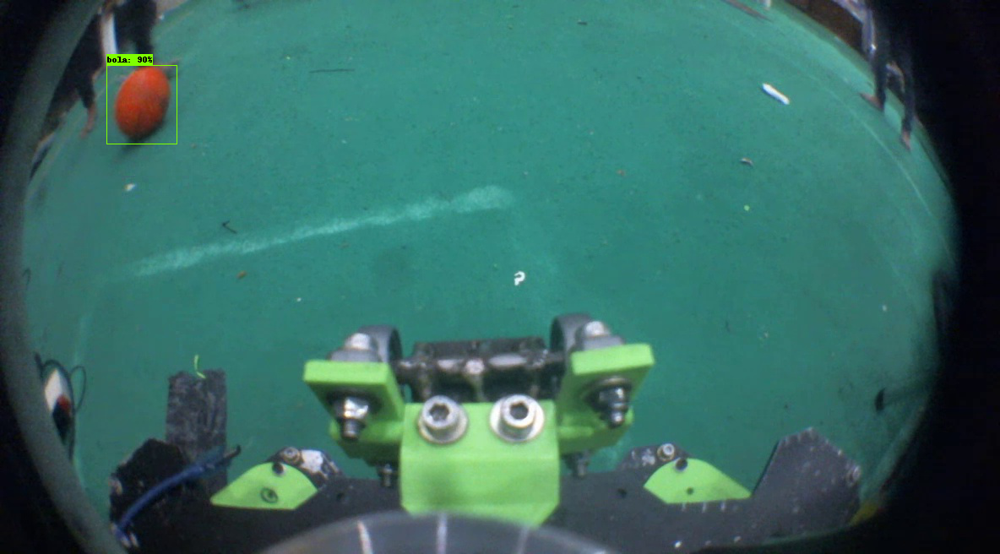

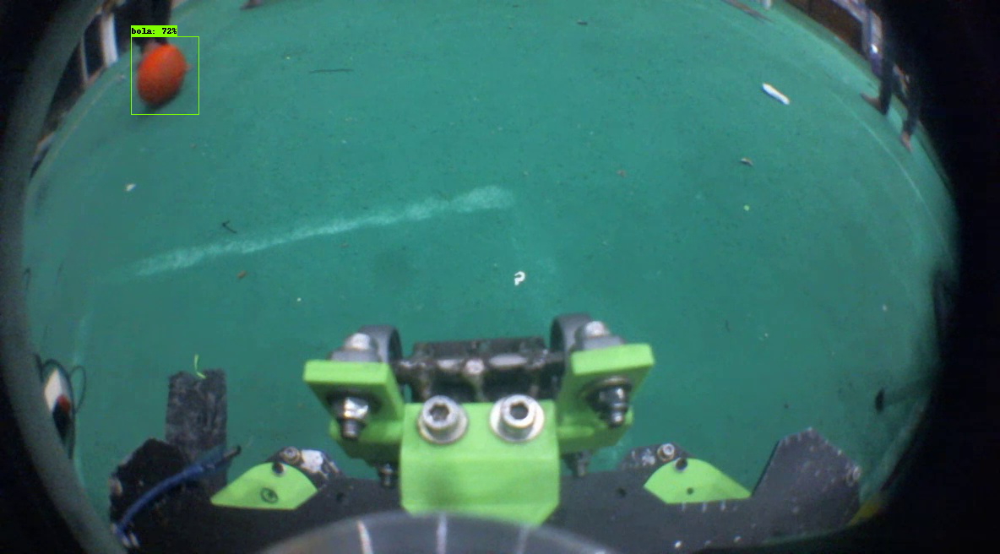

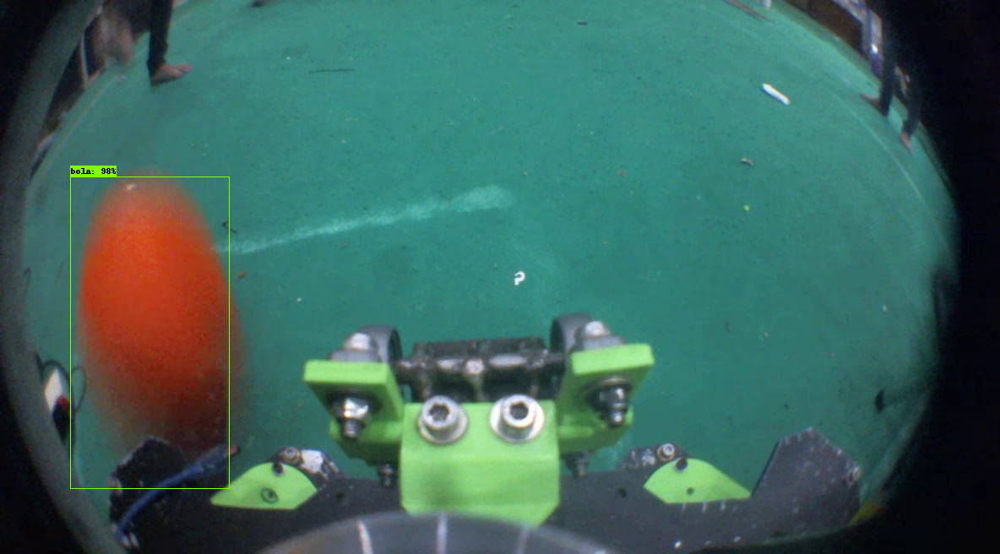

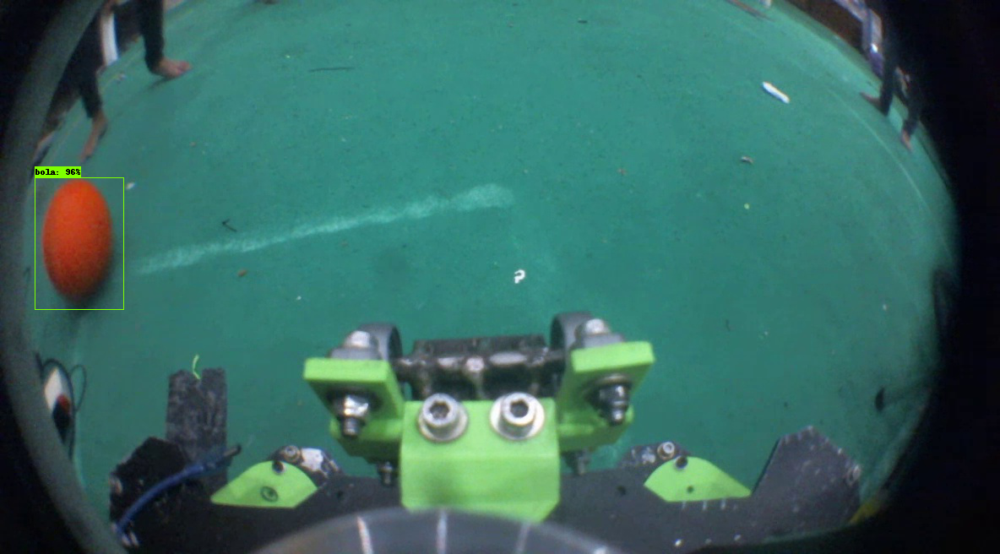

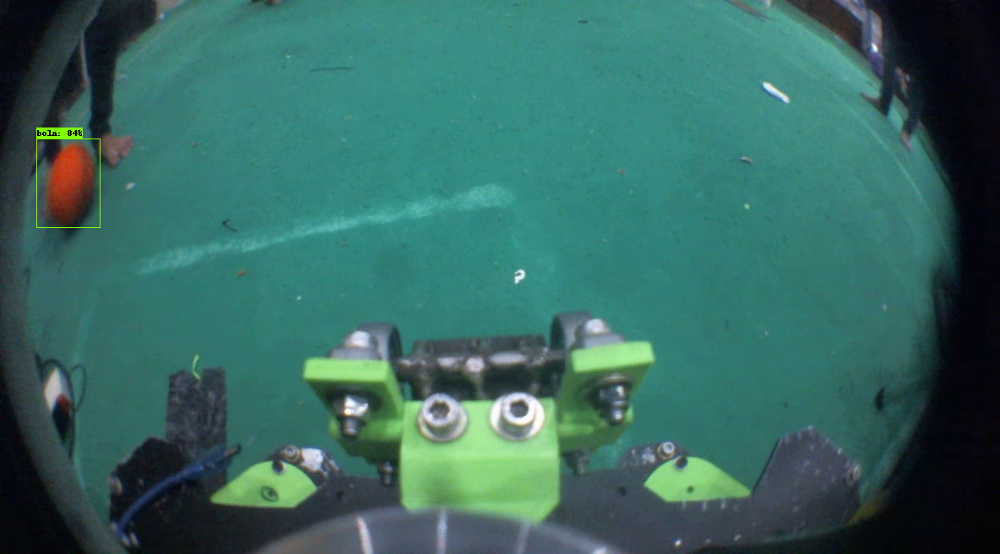

In [ ]:
!pip install git+https://github.com/google-research/tf-slim.git
%cd /content/drive/Shareddrives/Jetson/New_Train/models/research/object_detection

import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import tf_slim as slim

from distutils.version import StrictVersion
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")

from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util



### Model preparation variable
MODEL_NAME = '/content/drive/Shareddrives/Jetson/New_Train/training_workspace/checkpoint'
PATH_TO_FROZEN_GRAPH = MODEL_NAME + '/frozen_inference_graph.pb'
PATH_TO_LABELS = '/content/drive/Shareddrives/Jetson/New_Train/training_workspace/label_map.pbtxt'
NUM_CLASSES = 2 #remember number of objects you are training? cool.


### Load a (frozen) Tensorflow model into memory.
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_FROZEN_GRAPH, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')


###Loading label map
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)




### Load image into numpy function
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)




###STATING THE PATH TO IMAGES TO BE TESTED
PATH_TO_TEST_IMAGES_DIR = '/content/drive/Shareddrives/Jetson/New_Train/training_workspace/images/test/'
TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, 'test{}.jpg'.format(i)) for i in range(70, 80) ]
#TEST_IMAGE_PATHS = '/content/drive/Shareddrives/Jetson/New_Train/training_workspace/images/test/0574.jpg'
IMAGE_SIZE = (12, 8)




### Function to run inference on a single image which will later be used in an iteration
def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[1], image.shape[2])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: image})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.int64)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict



### To iterate on each image in the test image path defined 
### NB define the range of numbers and let it match the number of imAGES IN TEST FOLDER +1
for image_path in TEST_IMAGE_PATHS:
  #image = Image.open('/content/drive/Shareddrives/Jetson/New_Train/training_workspace/images/test/0574.jpg')
  image = Image.open(image_path)
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np_expanded, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=1)
  display(Image.fromarray(image_np))